# Software Pipeline 
## Dhruv Paranjpye (pdhruv@umich.edu, dhruvp@caltech.edu)
The following Jupyter notebook is a detailed documentation of the software pipeline for pre-processing of RoboPol Data for use in classifying artifacts and stars in an image using a Convolutional Neural Network. Each stage of the pipeline has a code along with detailed documentation of its working and what each line of the code means. The following are the different stages of the pipeline from the beginning to the end:
1. JSON File - Will store paths of directories of images, coordinate files for other programs to read from
2. Search and Copy - Searches images with artifacts and copies them to a destination folder
3. IRAF Imexamine  - Record coordinates of artifacts
4. Sextractor - Automatically record coordinates and magnitudes of stars in an image
5. Sorting - Sort the output of sextractor files in ascending order of apparent magnitude of stars
6. Extract Stars - Extract and save coordinates of detected stars in a separate file for each image
7. Extract Artifacts - Extract and save coordinates of artifacts in a separate file for each image
8. FITS to PNG - Convert all FITS images to PNG format
9. Cutouts - Make 64 x 64 pixel cutouts of artifacts and stars

We will go through each stage in the above order. The structure of every code is in the form of a Python function. All Python codes can be executed individually from the terminal without any input arguments. A substantial effort has been made to avoid making use of external Python libraries unless there is no other option such as the case when reading FITS files using astropy. 



# Directory organization

In order to be able to run all codes without any issue, we have to arrange them as per the directory shown in the following GitHub link: 

https://github.com/delta-papa/pipeline


An easy way would be to simply clone this folder to your computer. All the user should be working on is editing the JSON file as mentioned in the JSON file section. Any suggestions to improve this method of giving inputs to the JSON file are welcome! Note that this is a private repo and we will not be making this public since it contains data that hasn't been made public yet. 

# Problem Statement

We have several artifacts that are present in RoboPol images due to which polarimetric measurements are affected. Therefore, we aim to automatically detect the artifacts and correct for them. Below is a typical artifact seen in RoboPol data due to reflections in the instrument from bright stars. As a beginning, we have focused only on these reflection artifacts and labeled them manually from about 90 images. Each image had about 5 to 6 of such artifacts on an average. This Jupyter notebook aims to work on processing the RoboPol Images so that we can make cutouts of artifacts and stars from the images and feed them to a convolutional neural network. 

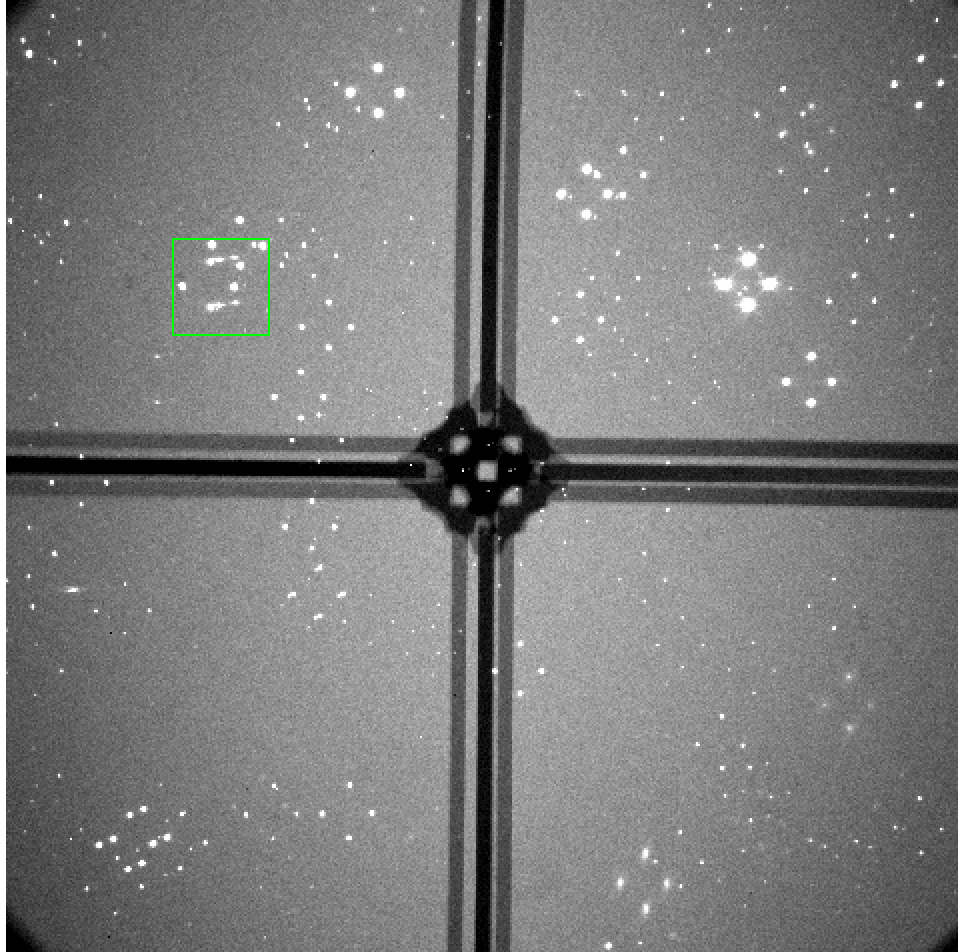

In [1]:
from IPython.display import Image
Image('artifact.png',height=400,width=400)

#### An Image of a typical RoboPol observation with the green box showing the reflection artifact. 

# JSON File

A JSON file in Python stands for JavaScript Object Notation. It is used as a standard data interchange format mainly for transmitting data between a web application and a server. We will use this file mainly to store information of software paths of different files and other inputs that would be required for running the code. 

Following is the JSON File. 

'input_param' is a dictionary with keywords that would be used to get information required for the codes. Each keyword represents the name of a code in the pipeline. Following is a description of the keywords:

#### 1. search_copy:

The first argument here is the path of the folder where we store the RoboPol Data.

The second argument is the path of the folder where we want to store the images which contain artifacts. 

The third argument is the path of the textfile which has a list of images that we know have artifacts. 


#### 2. sorting:

The first argument is the path where all the .cat files are stored

The second argument is the path where all sorted .cat files will be saved with extension .txt

#### 3. extract_stars:

The first argument is the path where all the text files having coordinates of extracted stars would be kept.

The second argument is the path where all the sorted .cat files are stored


#### 4. extract_artifacts:

The first argument is the path where all the text files having coordinates of extracted artifacts would be kept.

The second argument is the path to the log file generated from imexamine

#### 5. fits_to_png: 

The first argument is the path to the folder where all FITS Images are kept.

The second argument is the path to the folder where all the PNG Images would be stored


#### 6. cutout: 

The first argument is the path to the folder where all the PNG images are stored.

The second argument is the path to the folder where all the coordinate files containing coordinates of artifacts are stored.

The third argument is the path to the folder where all the coordinate files containing coordinates of stars are stored.

The fourth argument is the path to the folder where all the cutouts of reflection artifacts would be stored.

The fifth argument is the path to the folder where all the cutouts of stars would be stored. 

#### 7. cnn:
The first argument is the path to the folder where all training images for cutouts of reflection artifacts are kept

The second argument is the path to the folder where all training images for cutouts of stars are kept

The third argument is the path to the folder where all testing cutout images are kept.

The fourth argument is the path to the folder where all testing cutout images of artifacts are kept.

The fifth argument is the path to the folder where all testing cutout images of stars are kept.




In [2]:
import json
input_param = {"search_copy": ["/home/walop/Documents/data/",
                               "./artifact_images",
                               "/home/walop/Documents/out.txt"],
"sorting": ["./artifact_images/catalog/",
            "./sorted/"],
"extract_stars": ["./extract_stars/",
                  "./sorted/"],
"extract_artifacts": ["./extract_artifacts/",
                     "./artifact_images/output_87.log"],
"fits_to_png": ["./artifact_images/*.fits",
               "./png/"],
"cutout": ["./png/*.png",
          "./extract_artifacts/",
          "./extract_stars/",
          "./cutout/reflection_training/",
          "./cutout/star_training/"],
               
"cnn": ["./cutout/reflection_training/",
       "./cutout/star_training/",
       "./cutout/test/",
       "./cutout/test/artifacts/",
       "./cutout/test/stars/"],
               
"testing_script": ["./artifact_images/catalog/",
                  "./artifact_images/"]

}

with open('input_param.json', 'w') as json_file:
    json.dump(input_param, json_file)


# Code for Searching through directories of images for required images and copying them into a destination directory

This is the first function that we execute. Before usage check the following:

#### Inputs:
1. Enter the paths of 

a) Folder that contains the RoboPol data 

b) Folder where we want to store the images containing artifacts 

c) Textfile which has a list of the names of the images which we know have artifacts 

in the search_copy keyword of the JSON File as described in the JSON section. 


#### Usage: 
In the terminal, go to the home directory and type :

    python search_and_copy.py
#### Assumptions:
1. The first assumption is that each line in the text file has a part of the filename of the image without the extension. An example textfile is given with the name "bad_data.txt" 
2. The second assumption is that all images are contained in a directory which could have multiple subdirectories. This is common when you segregate data according to the date of observation into subdirectories.
3. The final assumption is that the data are FITS files. 

The code has been made generic enough to be modified with very small modifications for images or files of different types. 



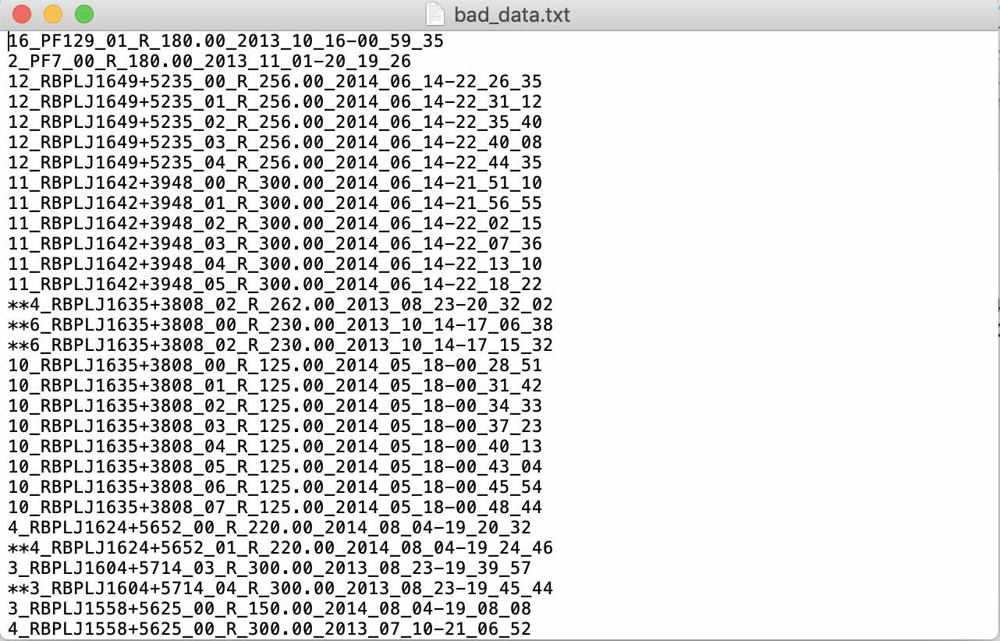

In [3]:
from IPython.display import Image
Image('baddata.png')

#### Figure 1: Screenshot of how the bad_data.txt file looks like. Just includes the names of the images. 

In [4]:
import os
from shutil import copy
import json

def search_and_copy():
    json_file=open('input_param.json')
    data = json.load(json_file)
    
    source=data['search_copy'][0] #path where original RoboPol data is stored
    dest=data['search_copy'][1] #path where selected artifact images have to be kept ready
    textfile=data['search_copy'][2] #path to the textfile containing the names of images having artifacts
    
    f=open(textfile,"r") #read the textfile
    
    lines=f.readlines() #store all lines in file in list "lines"    

    for line in lines: 
        #go through every image name ('line') in the text file
        for dirpath, dirnames, filenames in os.walk(source): 
            #walk through all subdirectories and files in them
            
            image=line #Why we store line in image is because we will be 
            #appending .fits to the line every iteration. Therefore, 
            #we don't want to keep appending .fits to lines already 
            #ending with .fits else it would become something like 
            #.fits.fits and so on
            image=image.strip() #we strip the whitespace from each line
            image=image+".fits" #we add a '.fits' extension to each line 

            #First, make a list of all those files in each directory 
            #that end with the given "line" (image name) in our "bad_data.txt" 
            #file. That is make a list of all those images in 
            #each directory which have the same name as that of the 
            #names in our "bad_data.txt" file.
            #Then iterate through those found images in each directory. If they are
            #not already in the destination directory copy them to destination
            #and copy them to destination directory. 

            for foundfile in [fi for fi in filenames if image in fi]:
                src=os.path.join(dirpath,foundfile) #store the path of the image in list 'src'
                if not foundfile in os.listdir(dest):
            
                    copy(src,dest) #copy list 'src' to destination'dest' which can be a directory or a file
#search_and_copy() #Uncomment this to run the code in Jupyter notebook

# IRAF Imexamine

In order to train our Convolutional Neural Network we need to identify the artifacts and label them. Therefore, we need to manually first open the images containing the artifacts and record the pixel coordinates of the center of those artifacts. The Image Reduction and Analysis Facility (IRAF) has a tool called imexamine that allows us to perform several image processing tasks. 

#### Steps:
1. In IRAF, type epar imexamine and edit the following: 
   a) logfile - Enter the name of the output file that would contain the coordinates and pixel brightness of the center of the artifact
   b) keeplog - change to yes if it is no. 
2. Go to the folder containing the artifact images (using cd command) and then type : 
        imexamine *.fits 
3. Hover the mouse over the approximate center of the artifact that is visible to your eyes and press x. You will see 3 things that are printed in the terminal: x coordinate, y coordinate, pixel brightness. The same will be stored in the output logfile as well.
4. Press n to go to the next image and repeat step 3.
5. To quit, press q


#### Caution:
1. Imexamine is a pretty old tool and we need to make sure that we perform the above steps just as they have been mentioned. For instance, if we press m instead of n, it will actually print some image statistics that cannot be removed from the file. In case that happens, be sure to record this on paper and then once the file is made go and remove those lines. 
2. Imexamine will loop through the images automatically and when it reaches the last image it will again go back to the first image. Therefore, record on paper which was the first image you started with so that you know when to press q. 
3. It happens quite often that we will again loop through the images from the beginning after the last image. If it does happen like that, go to the output file generated and remove the repeated logs from the end of the file. Note that each new image name is recorded in the output file beginning with the # symbol and a number encolsed in square brackets indicating the sequence number in the loop. That will help you identify if you repeated any of the starting images. 


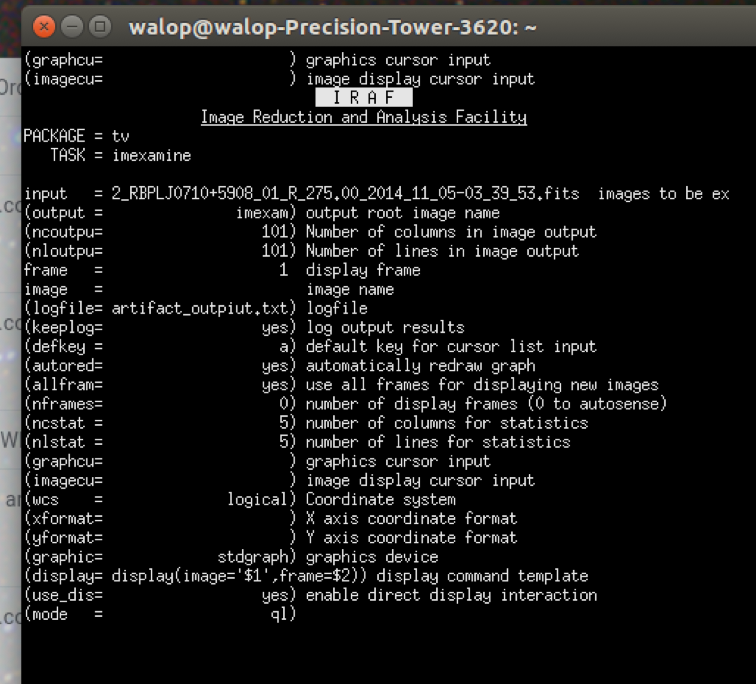

In [5]:
from IPython.display import Image
Image(filename='epar_imexamine.png',width=600,height=600) 

#### Figure 2: This is an image of the dialog box opened in IRAF for the command: epar imexamine


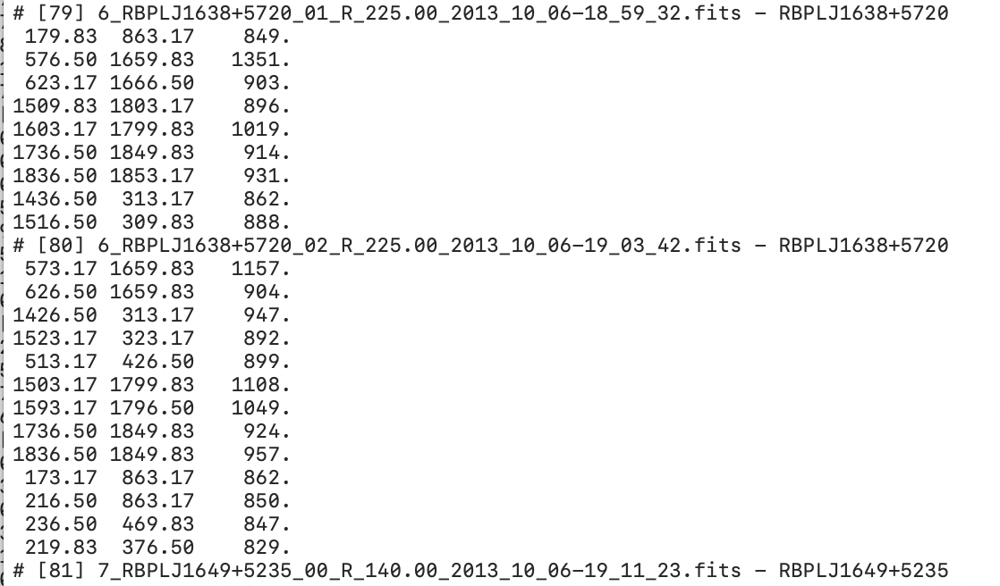

In [6]:
Image(filename='log.png',width=600,height=600) 

#### Figure 3: This is a screenshot of a part of the logfile generated using imexamine. You can see that a new image starts with a # symbol followed by the number of the image in the sequence and the name of the image. This is followed by the x coordinate, y coordinate and intensity of the pixel on which the mouse was centered.   

# Sextractor

Run sextractor software tool that is freely available online to complete the process of extracting stars automatically from a FITS image. Make sure you know the locations of default.sex, default.param, default.conv files. I usually keep them in the same folder where the FITS images are present. We would have lot of images and it would be tedious to run sextractor for each FITS image. Therefore, to do it in a batch, we simply do the following:

1. In the terminal, use the cd command to go to the folder containing the artifact images. 
2. Open the default.param file of sextractor and uncomment the following parameters:
    1. MAG_BEST
    2. X_IMAGE
    3. Y_IMAGE
    4. FLAGS
3. In step 2, we tell sextractor to only give us the above information for every star it detects. MAG_BEST is the best magnitude, X_IMAGE and Y_IMAGE are the x and y coordinates of the center of the star and FLAGS is the extraction flag error. You can find a detailed description online at:
https://sextractor.readthedocs.io/en/latest/Param.html 


4. Change terminal type to csh
5. Type the following: 

    foreach f (*.fits)
    echo "sex  \\$ f - CATALOG_NAME \$f:r.cat"
    end
    
6. In step 5, it would print on the terminal the commands for running sextractor on every FITS image. Copy and Paste these in a new file called runme. You can create this file using the following command: vi runme
7. Type: csh < runme.
8. You can type the command ls and see that .cat files with names as the names of the FITS images are created. 
9. Copy all the .cat extension files to the catalog folder in the same directory


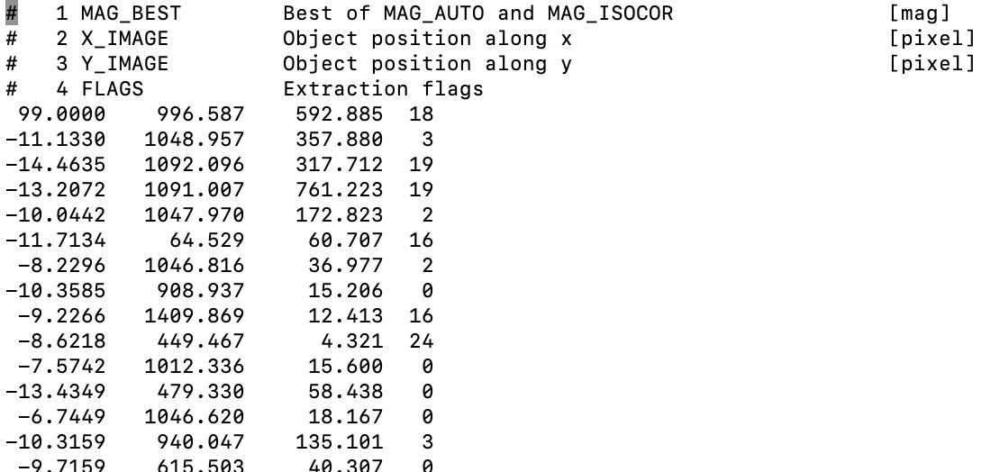

In [7]:
Image(filename='cat file.png',width=600,height=600) 

#### Figure 4: This shows a screenshot of the catalog file generated from sextractor with our parameters. 

# Code to sort all .cat files from Sextractor according to their magnitudes and extraction flags


Following is a Python code that will sort all .cat files from Sextractor according to the following criteria:


1. The lines in the files must end with 0 i.e. the extraction flag of the particular star is 0 indicating there were no errors or warnings while doing extraction. 
2. Sort them according to their magnitude in ascending order (more negative numbers in astronomical magnitudes are brighter stars. 


Our sextractor output .cat file has 4 columns:

1. Best Magnitude
2. X coordinate of star
3. Y coordinate of star
4. Extraction Flag


This code has been made generic enough to be editable for different sextractor .cat output files.


A final .txt file is made which has the same 4 columns but with the 1st column sorted in ascending order and the 4th column only having the 0 extraction flag. 


#### Assumptions:
1. All .cat files are in the path provided in sorting key of the JSON input_param dictionary.
2. They are organized according to the sample .cat file format mentioned above.



In [8]:
import os
import json
def sorting():
    
    json_file=open('input_param.json') #open parameter file
    data = json.load(json_file) #load everyting into dictionary called 'data'
    json_file.close() #close the parameter file
    
    sorting_path=data['sorting'][0] #get the path where all the .cat files are stored
    
    txt_path=data['sorting'][1] #path where all sorted .cat files will be made with extension .txt
    
    for file in os.listdir(sorting_path):
        
        
        if file.endswith(".cat"): #proceed if file is a ".cat" file
            cat_file=sorting_path+file
            filename=open(cat_file,"r") #open the file in reading mode
            lines=filename.readlines() #store all lines in the file in a list
            filename.close()

            src=txt_path+file[:-4]+".txt" 
            #remove the .cat extension and append .txt extension instead to the filename

            writefile=open(src,"w") #open a new file with above .txt name in writing mode.

            #write those lines in the original file which end with 0 to the file 'src'
            #note that you may have to strip any leading and trailing whitespaces using .strip() method
            #for strings 

            for foundlines in [fi for fi in lines if fi.strip().endswith("0")]:
                writefile.write(foundlines)

            writefile.close() #close the file

            f=open(src,"r") #open the src file in read mode.
            newlines=f.readlines() #store all its lines in a list
            newlines.sort(reverse=True) #sort the lines numerically in descending order.
            #Note that although we said ascending order above, here Python doesn't consider the minus sign 
            #and hence we should sort in reverse.
            f.close()

            f=open(src,"w") #open the src file in write mode.
            f.truncate(0) #erase all of its contents

            for l in newlines: #loop through the sorted lines and write them in the file we just erased
                f.write(l)
            f.close()
            #Your text files are ready.
            
#sorting() #Uncomment if you want to run this code 


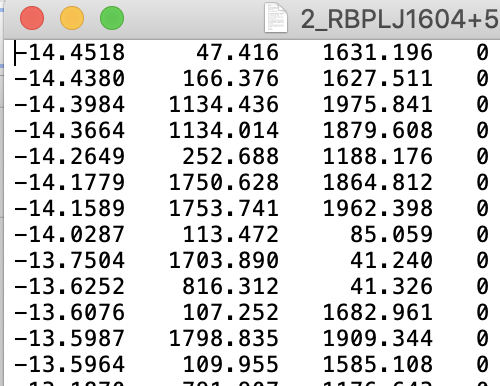

In [9]:
Image(filename='sorted.png',width=400,height=200) 

#### Figure 6: A screenshot of the sorted output file made using the sorting.py code 

# Code to extract stars from the sorted sextractor output file

The .txt file generated using sorted.py contains 4 columns: 
1. Magnitude (Sorted in numerically ascending order)
2. X position
3. Y position
4. Extraction Flag


#### Algorithm:
1. Store the filename (name of image) of .txt file.
2. Read each line.
3. If x and y are outside our criteria, go to next line.
4. If a line matches our critera, write the x and y coords to a new .txt file with a slight name change.
5. Stop if 6 stars have been found and exit the file.


Here our criteria is to collect 6 stars with different instrumental magnitudes ranging from -12 to -9.7. This will help us have a spread of magnitudes in our stars that are extracted. Originally, the code was writen to extract the first 4 stars in every text file. However, that only gave us the brightest stars and hence fainter stars were being classified as artifacts. Therefore this code is a revision of the previous version. The only modification is the inclusion of the magnitude ranges r1 and r2. 

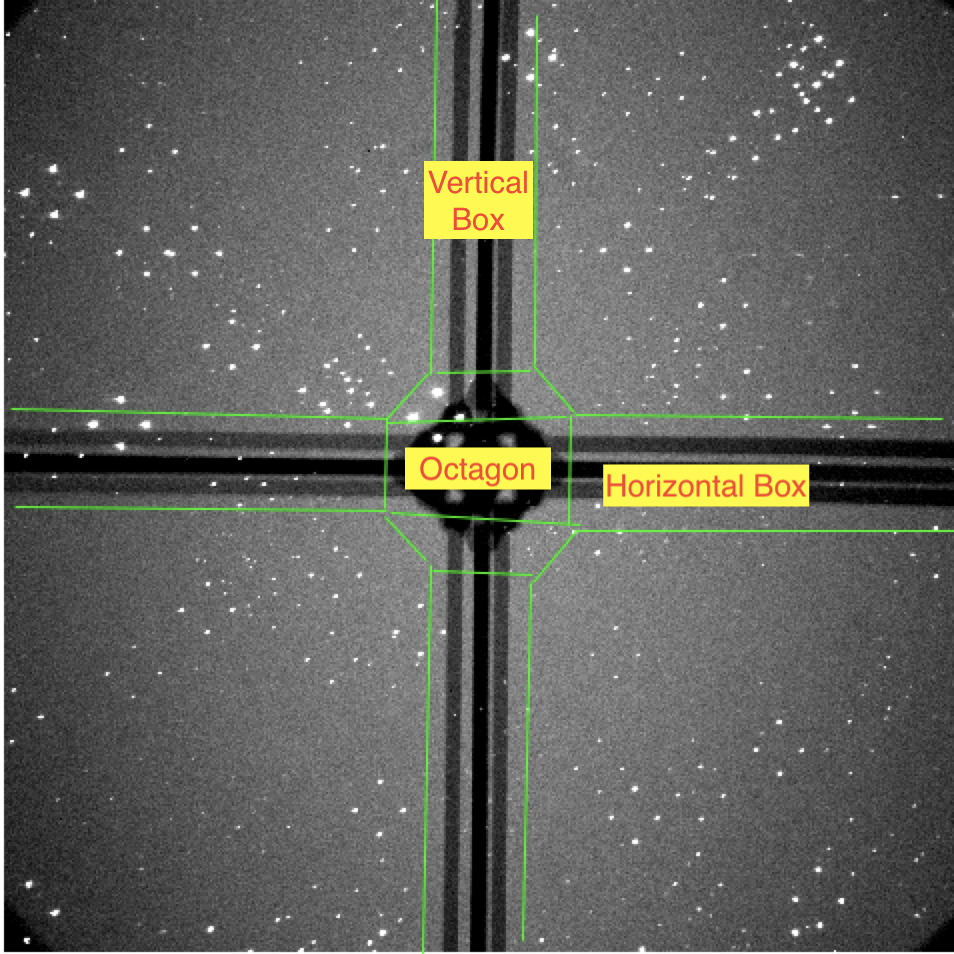

In [10]:
Image(filename="polygon.png",width=500,height=500)


#### Figure 7: 
As shown in the above image, we want to avoid having stars within the region enclosed by the green lines. The green lines are constructed by having good safety margins for the shifting of the RoboPol mask from image-to-image and by making sure that the 64x64 pixel box which we intend to have will be entirely outside this region. We choose 3 polygons: inner octagon, horizontal rectangle and vertical rectangle.

We check if the star (x,y coordinates) lies inside any of these 3 polygons and if it does then we don't choose that star. We also avoid stars which are within 60 pixels of the image borders. 

In [11]:
import os
import json

def extract_stars():
    

    json_file=open('input_param.json') #open parameter file
    data = json.load(json_file) #load everyting into dictionary called 'data'
    json_file.close() #close the parameter file


    #This code has been taken from the following website:
    #http://www.ariel.com.au/a/python-point-int-poly.html
    poly=[(883,853),(840,915),(840,1166),(883,1240),(1145,1240),(1175,1166),(1175,915),(1145,853)] 
    #coordinates of corners of polygon of RoboPol Mask
    
    
    
    hori=[(60,915),(60,1166),(1190,915),(1990,1166)] #Horizontal Box Coordinates
    vert=[(883,60),(1145,60),(883,1990),(1145,1990)] #Vertical Box Coordinates

    #x=457 #test pixel x coordinate
    #y=901 #test pixel y coordinate



    def point_inside_poly(x,y,poly):

        n=len(poly) #total number of corners in polygon

        inside=False

        p1x,p1y=poly[0] #first corner of polygon

        for i in range(n+1):
            p2x,p2y=poly[i % n] #iterating through every corner of polygon

            if y > min(p1y,p2y): #check if it is between the y coordinates of the 2 points
                if y<=max(p1y,p2y):                 
                        if(x<=max(p1x,p2x)): #if so then check if it is to the left of either of the points
                            if(p1y!=p2y): #to avoid division by 0
                                xinters=(y - p1y)*(p2x - p1x)/(p2y - p1y) + p1x #find the x coordinate of interior point
                            if(p1x == p2x) or (x <= xinters): #check for the condition
                                inside=not inside
            p1x,p1y=p2x,p2y

        return(inside)

    def point_near_boundary(x,y):
        near=False
        if(x<=60 or x>=1990 or y<=60 or y>=1990): #if near the boundary make near True
            near=not near

        return(near)

    path=data['extract_stars'][0] #Set the path where you want to store the result text files 

    sorted_path=data['extract_stars'][1] #path from where to read the sorted .txt files 

    for file in os.listdir(sorted_path): #go through all files sorted directory
        
        if file.endswith(".txt") and not file.startswith("coords_"): #the files should only be our original'.txt' files 
            c="" #we reset c each iteration to avoid having a repitition of file names
            d=1 #set a flag d to count how many stars are chosen. 
            
            filepath=os.path.join(sorted_path,file)
            
            f=open(filepath,"r") #open the file in read mode
            lines=f.readlines() #store lines in the file
            
            f.close()

            c="coords_"+file #c will contain the original image name prefixed by "coords_"
            coords=os.path.join(path,c) #coords is the path to the coordinate file with above path
            w=open(coords,"w") #open the file in write mode

            w.truncate(0) #erase any text if present
            
            r1=-12.3 #upper limit on magnitude
            r2=-11.8 #lower limit on magnitude

            for line in lines: #loop through all lines in the original file

                if(d==7): #only if 6 stars have been chosen then exit the loop
                    break
                line=(line.split()) #split the line so that white spaces are eliminated and you get 
                #a list of words for every line


                mag=float(line[0]) #find magnitude of the star
                

                if r1<=mag and r2>=mag: #if star magnitude lies in the above range continue


                    x,y=float(line[1]),float(line[2]) #store the x and y coordinates
                    if (point_inside_poly(x,y,poly) or point_inside_poly(x,y,hori) or point_inside_poly(x,y,vert) or point_near_boundary(x,y))==False:
                        w.write("%f\t%f\n"%(x,y)) #only if the point is not in the restricted regions write to the file               
                        d+=1 #increment the flag to indicate that you have a star which is not in the restricted regions

                        r1+=0.5 #decrement the upper and lower limit by 0.5
                        r2+=0.5
                
                    
                
            w.close() #close the file   
            
#extract_stars() #Uncomment this line if you want to run the code


# Code to extract artifacts

The code is similar to the code for extracting stars. Except that your input files are now the files made from imexamine command of IRAF. 

In [12]:
import os
import json

def extract_artifacts():
    
    

    json_file=open('input_param.json')
    data = json.load(json_file)
    
    logfile = data['extract_artifacts'][1] #path to logfile made using imexamine
    

    f=open(logfile) #read the log file
    path= data['extract_artifacts'][0] #specify output folder path

    lines=f.readlines() #store all lines in a list called 'lines'


#filelist = [ g for g in os.listdir(path) ] #collect any existing files in the output folder
#for anyfile in filelist: #loop through those files
#    os.remove(os.path.join(path, anyfile)) #remove those files
    lines=[lines[m].split() for m in range(len(lines))] #split the lines i.e. remove the whitespaces
    
    i=0 
    while i <= (len(lines)-1): 

        if(lines[i][0]=="#"): #we know it is a new image 
            image_name=lines[i][2] #store the name of the image
            name="arti_"+str(image_name) #prefix the name with "arti_"
            name=name[:-4]+"txt" #remove '.fits' extension and add '.txt' extension
            filename=os.path.join(path,name) #store final path
            w=open(filename,"w") #open the new result file
            i+=1 #increment pointer by 1
            while(lines[i][0]!="#"): #make sure the line is a coordinates line and not image description line
                x,y=float(lines[i][0]),float(lines[i][1]) #store x and y coordinates
                w.write("%f\t%f\n"%(x,y)) #write the x and y to file
                i+=1 #increment by 1 
                if i==len(lines): #if we have reached end of file exit the program
                    break        

            w.close() #close the file
            
#extract_artifacts() #Uncomment the line if you want to run this code here

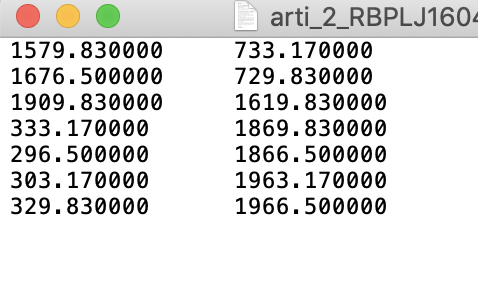

In [13]:
Image(filename="coords.png",width=500,height=500)


#### Figure 8:  
A screenshot of the output file generated for a given image showing the coordinates of artifacts in the 2 columns

# Code for converting FITS to PNG 
Our purpose in the following code is to read a FITS Image and save it as a PNG file by applying appropriate image stretching. We often find that FITS files need to be stretched in suitable FITS Image viewer software like DS9 so that they can be comfortable viewed by our eyes. Otherwise they mostly appear dark. This stretching is done to the range of the histogram. Depending upon the images you have different stretching methods might be useful for you. For instance, some images can do away with a simple linear stretch while others may need a 'sqrt' stretch. 


The pixels within a particular range we decide are scaled according to the formula:

Pout = (Pin - c) * (b - a) / (d - c) + a

where c is the (median value - 0.5 * standard deviation), d is the (median value + 2 * standard deviation), b is the maximum value of the output image (255 for 8 bit grayscale) and a is the minimum value of the output image (0 for 8 bit grayscale).

In our case, we saw that most of the pixels were having intensity values closer to the minimum value. Therefore, we found out the median pixel value of our images and then set our range to be 
median - 0.5 * std_dev to median + 2 * std_dev. All pixels with values between this range were scaled according to the above formula. Pixels with values less than median - 0.5 * std_dev were set to 0 and those above median + 2 * std_dev were set to 255. 


We use Python and hence it is important to avoid use of for loops. Hence we use faster methods like list indexing using numpy library to quickly find those pixels satisfying a particular condition and set them to appropriate values.



In [14]:
import os
import glob
from astropy.io import fits
import numpy as np
from PIL import Image
import json


def fits_to_png():
    
    json_file=open('input_param.json')
    data = json.load(json_file)
    
    input_path=data['fits_to_png'][0] #path where you will find the fits images
    
    outpath=data['fits_to_png'][1] #path where you want to keep the png images
    
    for filename in glob.glob(input_path):
        image_data = fits.getdata(filename, ext=0)


        median=np.median(image_data) #median value of image
        std_dev=np.std(image_data) #std deviation of image 
        min_val=np.min(image_data) #minimum value of image
        max_val=np.max(image_data) #maximum value of image

        a=0 #minimum value in grayscale image
        b=255 #maximum value in grayscale image
        c=median-0.5*std_dev #lower threshold
        d=median+2*std_dev #higher threshold


        lower = image_data < c #find pixel values less than threshold
        image_data[lower] = 0 #set those values to 0

        higher = image_data > d #find pixel values greater than threshold
        image_data[higher] = 255 #set them to 255

        middle=  (image_data <= d) & (image_data >= c) #find pixel values between c and d

        image_data[middle]= (image_data[middle] - c)*(b - a)/(d - c) + a #scale those values according to our formula

        I = image_data.astype(np.uint8)#make sure you set the data type to unsigned integer 8 bit since it is a grayscale image
        
        I=np.rot90(I,2) #rotate by 90 degree twice
        I=np.flip(I,1) #flip horizontally so that it is same as original fits image
        img = Image.fromarray(I)
        filename=outpath+filename[18:-5] #strip ./artifact_images and .fits from the filename
        img.save(filename+".png","PNG") #save image as a PNG File

#fits_to_png() #Uncomment this line if you want the code to run


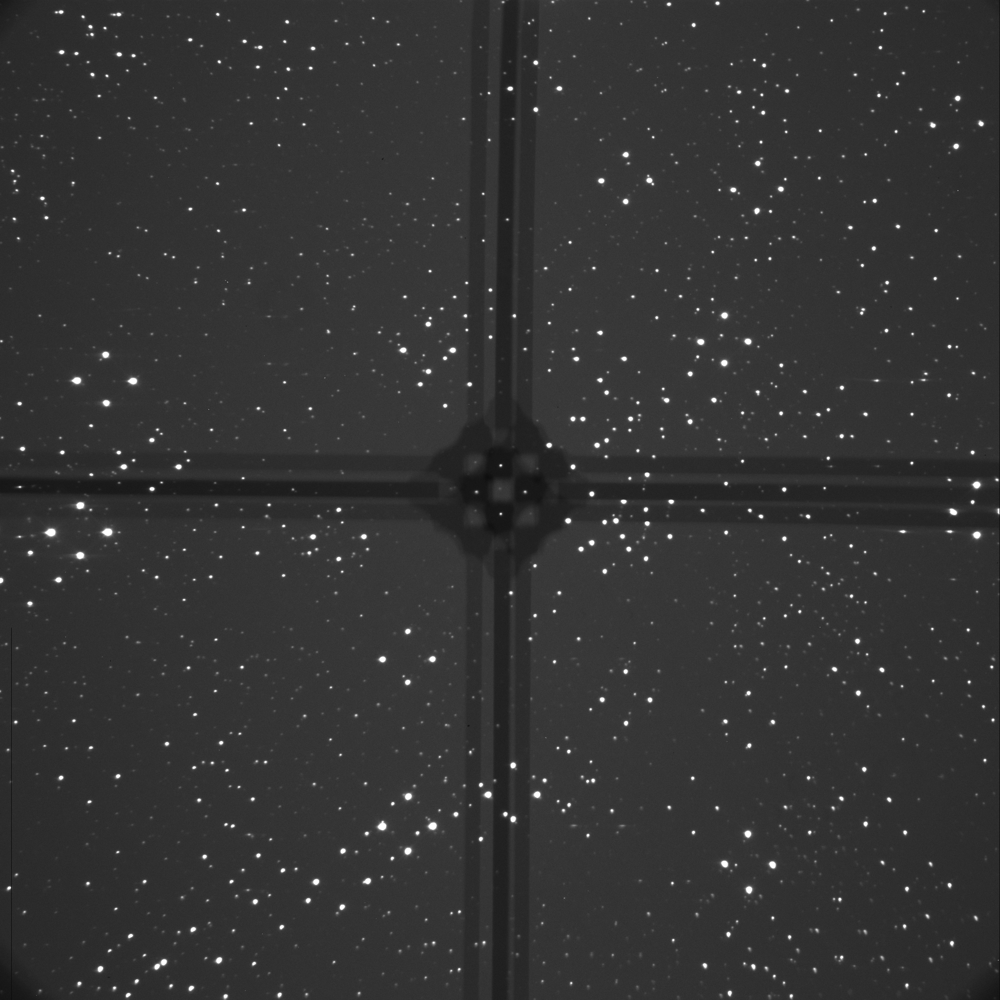

In [15]:
from IPython.display import Image
Image(filename="fitstopng.png",width=500,height=500)


#### Figure 9:
A FITS Image scaled and converted to PNG format

# Code to make cutouts

Now that we have the the coordinates of the artifacts and stars, we need to make 64 pix x 64 pix cutouts with the center of each cutout as the x and y coordinate of the artifact/star. We will keep the cutouts of artifacts and stars in different directories so that it is organized. Note that when we make cutouts in Python the image references are slightly different than in IRAF or DS9. Hence, we take care of that in this code. 

In [16]:
import os
import imageio
import glob
import json

def cutout():
    
    
    json_file=open('input_param.json')
    data = json.load(json_file)
    
    png_src=data['cutout'][0] #path to all png images 
    artifact_src=data['cutout'][1] #path to all artifact coordinate files
    stars_src=data['cutout'][2] #path to all star coordinate files
    
    ref_folder=data['cutout'][3] #path where all reflection artifact cutouts are kept 
    
    star_folder=data['cutout'][4] #path where all stars cutouts are kept
    
    
    
 
    for img in glob.glob(png_src):
        im=imageio.imread(img)        

        name=img[6:-3]+"txt" #strip the .png and path name from the image name and add .txt to the name

        #search for the artifact coordinate text file for this image
        arti_name=artifact_src+"arti_"+name 

        f=open(arti_name,"r") #open the artifact coordinate text file 
        lines=f.readlines() #store all the lines in the file in the lines list

        for line in lines: #loop through all the lines
            line=line.split() #split every word of the line as a string

            x,y=(line[0]),(line[1]) #store the x and y coordinates 
            x,y=float(x),float(y) #convert from string to float
            x,y=int(x),int(y) #convert from float to int 
            
            #The way coordinates are referenced in DS9 and IRAF is slightly different than for 
            #Python image viewers. Hence we need to apply the scaling below for the coordinates so that
            #we can make a correct cutout for a given x and y. 
            
            x1=2047-(y+32) 
            x2=2047-(y-32)
            y1=x-32
            y2=x+32

            cutout=im[x1:x2,y1:y2] #make a cutout based on the coordinates

            outname=ref_folder+"cut_arti_"+name[:-3]+"_"+str(x)+"_"+str(y)+".png" #store an output name
            imageio.imwrite(outname,cutout,format="PNG")

        f.close()
        
        #Repeat the same for stars
        
        star_name=stars_src+"coords_"+name 
        g=open(star_name,"r")
        star_lines=g.readlines()
        for l in star_lines:
            l=l.split()

            x,y=(l[0]),(l[1])
            x,y=float(x),float(y)
            x,y=int(x),int(y)
            x1=2047-(y+32)
            x2=2047-(y-32)
            y1=x-32
            y2=x+32

            cutout=im[x1:x2,y1:y2]
            outname=star_folder+"cut_star_"+name[:-4]+"_"+str(x)+"_"+str(y)+".png"
            imageio.imwrite(outname,cutout,format="PNG")
        g.close()
    
#cutout() #Uncomment this line if you want to run the code


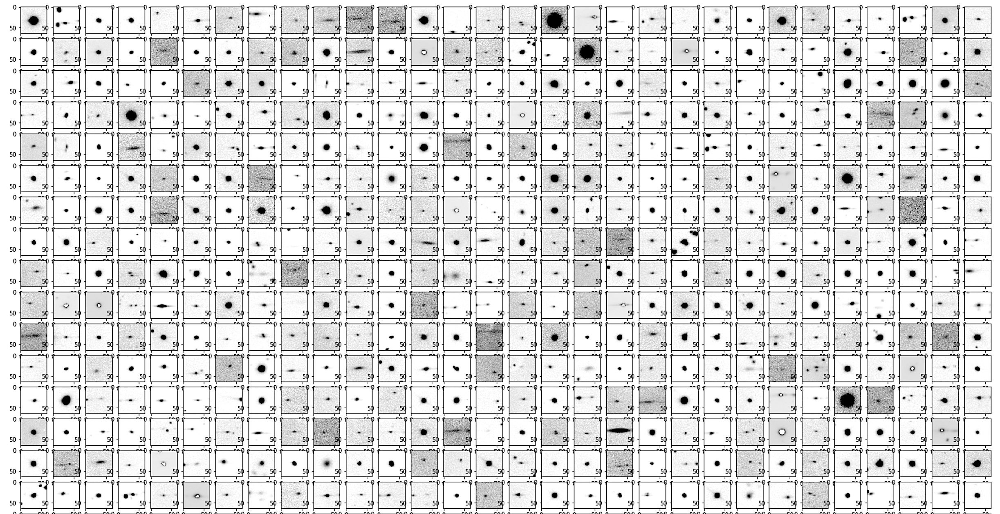

In [17]:
Image(filename="tile.png")


#### Figure 10: 
A Tile showing many of the 64 x 64 pixel cutouts made for stars and artifacts using the cutout.py program.